<a href="https://colab.research.google.com/github/LucaFedericoMarty/TP-T.E-IA/blob/main/Vegetable_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importacion y Set Up

### TPU

Corro un codigo para poder **detectar** si el entorno de Colab esta utilizando una TPU y si asi lo esta haciendo, que **version** de la misma

Utilizamos **TPUs** *(Tensor Proccesor Units)* puesto que este es un **hardware especializado** para **procesar tensores**, los cuales son los tipos de datos que le enviamos a la IA. Por esto, utilizando TPUs, podemos **acelearar** mucho el tiempo de entrenamiento.

In [ ]:
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

Tensorflow version 2.9.2
Running on TPU  ['10.51.35.226:8470']


### Uso comun

Importo ciertas librerias las cuales son impresindibles para un modelo de IA, tales como `OS` para abrir ciertos archivos, `numpy` para hacer ciertas operaciones, entre otras.

In [ ]:
import os 
import keras
import numpy as np 
import tensorflow as tf
import datetime

### Dataset

Estos modulos de estas librerias, me permiten **cargar** y **manejar** la carga de **datos** a Colab.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from numpy import expand_dims
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

### Modelo

Estos modulos de keras me permiten crear mas facilmente todas aquellas **capas** y cuestiones de **configuracion** necesarias para el modelo.

In [41]:
from keras.models import Sequential, load_model
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input, Activation
from tensorflow.keras.applications import VGG16

### Callbacks

Los modulos de las funciones **callbacks** que voy a utilizar para el entrenamiento

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

### Graficar 

Biblotecas para graficar resultados y datos

In [39]:
import plotly.express as px
import matplotlib.pyplot as plt
from keras.utils import plot_model

### Google Drive

Me conecto a Drive desde Colab, teniendo acceso a todos mis archivos de drive desde el entorno de Colab

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Descomprimo la carpeta del dataset, la cual contine tres subcarpetas. Una es de `training`, la cual cuenta con *15000 fotos* de 15 tipos de vegetales distintos (1000 imagenes por tipo de vegetal). En cambio, la de `test` y `validation` son de *3000 imagenes cada una*, con las mismas clases, pero siendo 200 imagenes por clase.

In [ ]:
!unzip gdrive/My\ Drive/ORT/TIC/T.E/Vegetable\ Data.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: Vegetable Images/train/Radish/0001.jpg  
  inflating: Vegetable Images/train/Radish/0002.jpg  
  inflating: Vegetable Images/train/Radish/0003.jpg  
  inflating: Vegetable Images/train/Radish/0004.jpg  
  inflating: Vegetable Images/train/Radish/0005.jpg  
  inflating: Vegetable Images/train/Radish/0006.jpg  
  inflating: Vegetable Images/train/Radish/0007.jpg  
  inflating: Vegetable Images/train/Radish/0008.jpg  
  inflating: Vegetable Images/train/Radish/0009.jpg  
  inflating: Vegetable Images/train/Radish/0010.jpg  
  inflating: Vegetable Images/train/Radish/0011.jpg  
  inflating: Vegetable Images/train/Radish/0012.jpg  
  inflating: Vegetable Images/train/Radish/0013.jpg  
  inflating: Vegetable Images/train/Radish/0014.jpg  
  inflating: Vegetable Images/train/Radish/0015.jpg  
  inflating: Vegetable Images/train/Radish/0016.jpg  
  inflating: Vegetable Images/train/Radish/0017.jpg  
  inflating: Vegetabl

Sabiendo que tengo 15 subdirectorios con el nombre de cada clase, recorro esos 15 subdirectorios, agarrando el nombre de cada uno, para tener una lista con todos los nombres y saber cuantos son.

In [ ]:
root_path = 'Vegetable Images/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Class Distribution
class_dis = [len(os.listdir(root_path + name)) for name in class_names]


# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 15 
Class Names : ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


Grafico la proporcion de la cantidad de imagenes que hay por clase

In [ ]:
fig = px.pie(names=class_names, values=class_dis, title="Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

### Cargar Dataset

Creo un preset con el cual voy a modificar las imagenes del dataset. Estos presets son distintos tanto para los datos de entrenamiento, como para los de testeo y validacion. 

Para los de entrenamiento, para poder tener distitnos casos de imagenes y que no sean imagenes identicas, le agrego rotaciones, cambios de brillosidad, distorsiones, entre otras. Esto favorece a que el modelo aprenda mejor.

En los tres conjuntos de datos, se normalizan los datos entre 0 y 1, para que la IA sea capaz de procesar todo. Como valid y test son para testear y comprobar el modelo, estas augmentations no son necesarias. 

In [ ]:
train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    height_shift_range=0.5,
    width_shift_range=0.5,
    brightness_range=[0.3,1.5],
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

In [ ]:
valid = ImageDataGenerator(
    rescale=1./255)

In [ ]:
test = ImageDataGenerator(
    rescale=1./255)

Rutas de las tres carpetas

In [ ]:
train_path = 'Vegetable Images/train'

In [ ]:
valid_path = 'Vegetable Images/validation'

In [ ]:
test_path = 'Vegetable Images/test'

Cargo los datos de entrenamiento, validacion y testeo por **baches**, para no *sobrecargar la RAM*. Tambien, **desordeno las imagenes** de manera random y las resizeo a **256x256 px**

In [ ]:
train_data = train.flow_from_directory(train_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 15000 images belonging to 15 classes.


In [ ]:
valid_data = test.flow_from_directory(valid_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 3000 images belonging to 15 classes.


In [ ]:
test_data = test.flow_from_directory(test_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 3000 images belonging to 15 classes.


### Augmentation demostracion

Utilizando una imagen en particular, le aplico y muestro todas las modificaciones para poder visualizar que tipo de cambios se producen en las imagenes y cuanto afecta esto a las mismas.

Cambios:



*   Cambiios de brillosidad
*   Rotaciones
*   Distorciones de alto
*   Distorciones de largo
*   Distorciones angulares
*   Zooms
*   Rotaciones en horizontal
*   Rotaciones en vertical









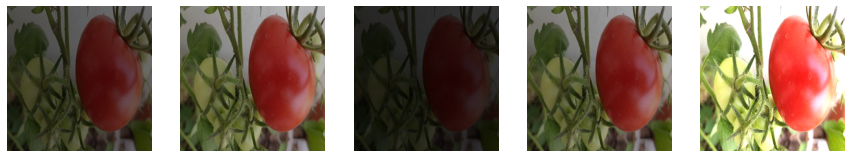

In [ ]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(brightness_range=[0.1,1.5])

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

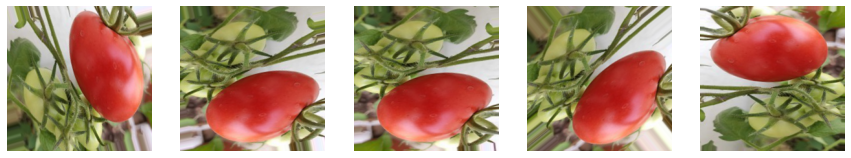

In [ ]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(rotation_range=90)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

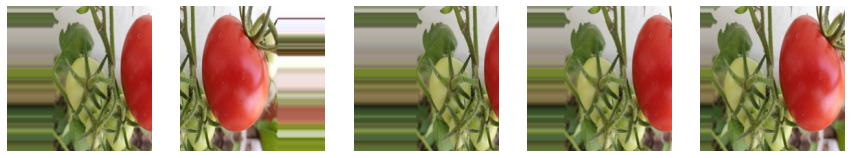

In [ ]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(height_shift_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

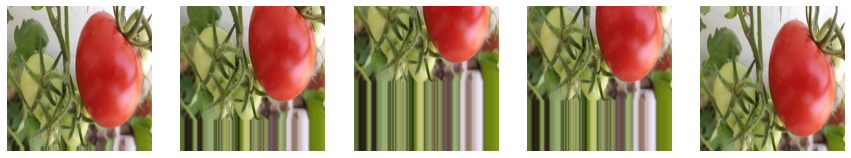

In [ ]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(width_shift_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

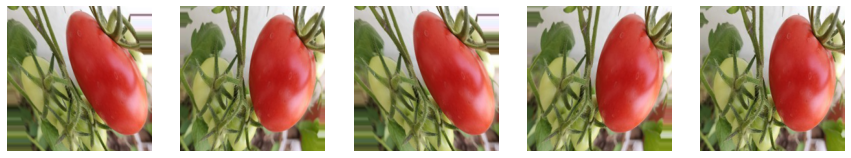

In [ ]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(shear_range=40)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

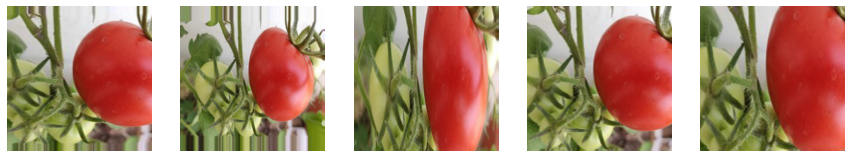

In [ ]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(zoom_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

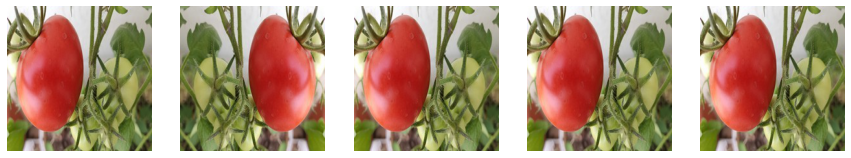

In [ ]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(horizontal_flip=True)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

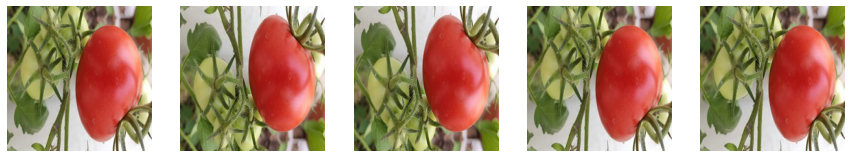

In [ ]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(vertical_flip=True)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

n_imgs = 5

# generate samples and plot
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# generate batch of images
for i in range(n_imgs):

	# convert to unsigned integers
	image = next(aug_iter)[0].astype('uint8')
 
	# plot image
	ax[i].imshow(image)
	ax[i].axis('off')

### Dataset Visualization

Creo una funcion con la cual visualizo las imagenes y sus respectivas clases. Ademas, sirve para utilizar para predicir la clase de un vegetal y mostar la imagen.

In [ ]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_data):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(32)
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

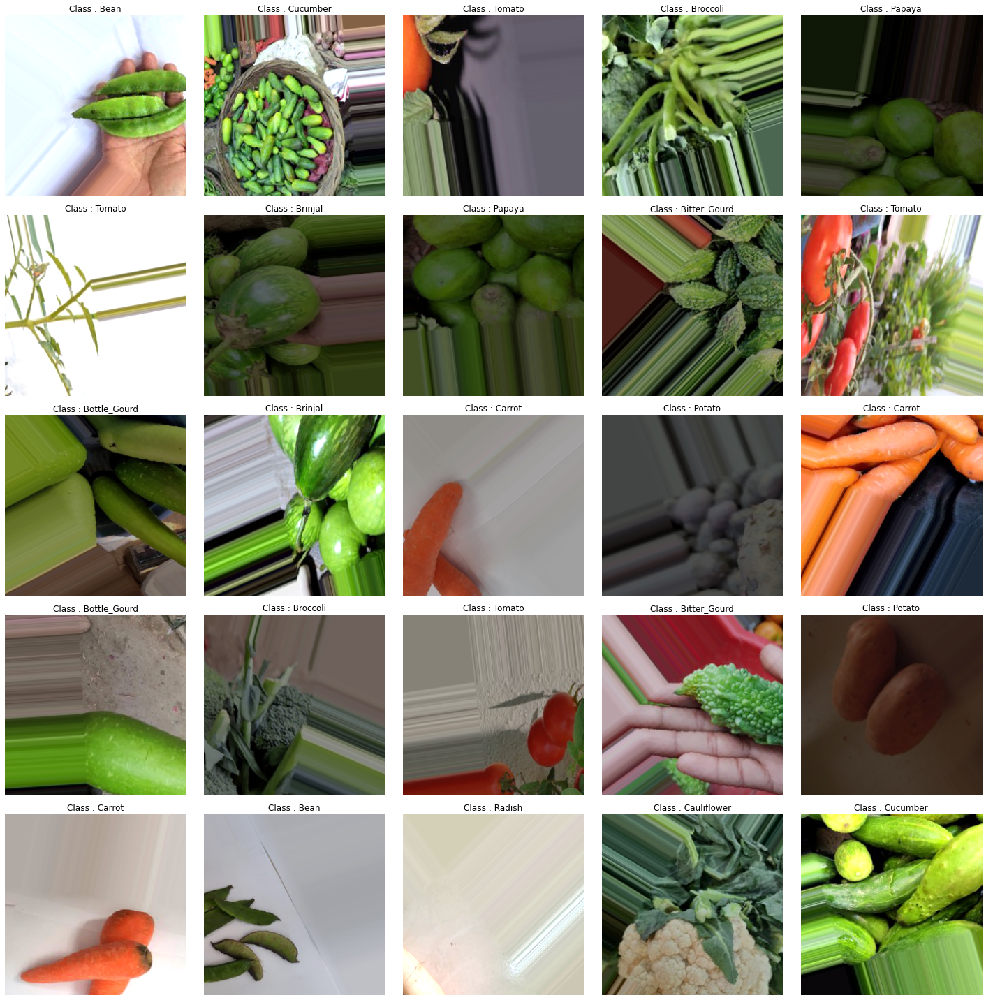

In [ ]:
show_images()

### Modelo

In [45]:
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(256, 256, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(n_classes, activation = 'softmax'))

In [46]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 activation (Activation)     (None, 254, 254, 32)      0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 32)      9248      
                                                                 
 activation_1 (Activation)   (None, 125, 125, 32)      0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                  

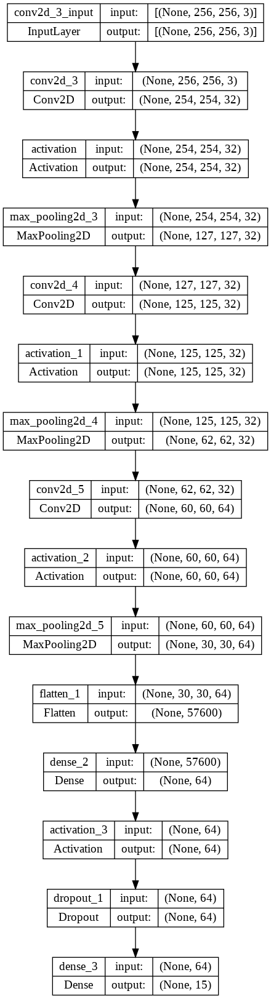

In [47]:
plot_model(model, 'net.png', show_shapes=True)

In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=10, # how many epochs to wait before stopping
    restore_best_weights=True
)

In [ ]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
filepath = 'my_best_model.epoch{epoch:02d}-loss{val_loss:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(filepath=filepath,
                                   monitor='val_loss',
                                   verbose=1,
                                   save_best_only=True)

In [ ]:
cbs = [early_stopping, tensorboard_callback, model_checkpoint]

In [ ]:
hist = model.fit(train_data, validation_data = valid_data, epochs=50, batch_size = 512, callbacks=cbs)

Epoch 1/50
469/469 [==============================] - ETA: 0s - loss: 2.3143 - accuracy: 0.2277
Epoch 1: val_loss improved from inf to 1.72063, saving model to my_best_model.epoch01-loss1.72.hdf5
469/469 [==============================] - 270s 557ms/step - loss: 2.3143 - accuracy: 0.2277 - val_loss: 1.7206 - val_accuracy: 0.3640
Epoch 2/50
469/469 [==============================] - ETA: 0s - loss: 1.9241 - accuracy: 0.3528
Epoch 2: val_loss improved from 1.72063 to 1.41267, saving model to my_best_model.epoch02-loss1.41.hdf5
469/469 [==============================] - 255s 544ms/step - loss: 1.9241 - accuracy: 0.3528 - val_loss: 1.4127 - val_accuracy: 0.4727
Epoch 3/50
469/469 [==============================] - ETA: 0s - loss: 1.7820 - accuracy: 0.4031
Epoch 3: val_loss improved from 1.41267 to 1.31200, saving model to my_best_model.epoch03-loss1.31.hdf5
469/469 [==============================] - 255s 545ms/step - loss: 1.7820 - accuracy: 0.4031 - val_loss: 1.3120 - val_accuracy: 0.5330

In [ ]:
model.save_weights('first_try.h5')

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

### Evaluacion

In [ ]:
model_path = 'best_model.hdf5'
model.load_weights(model_path)

loss, accuracy_d = model.evaluate(test_data, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * accuracy_d))

94/94 - 72s - loss: 0.4063 - accuracy: 0.8697 - 72s/epoch - 766ms/step
Restored model, accuracy: 86.97%


In [ ]:
model.save('my_model')

In [ ]:
# Specify Model Path
model_path = 'my_model'
model = load_model(model_path)

# Architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 64)       0

1/1 [==============================] - 0s 45ms/step


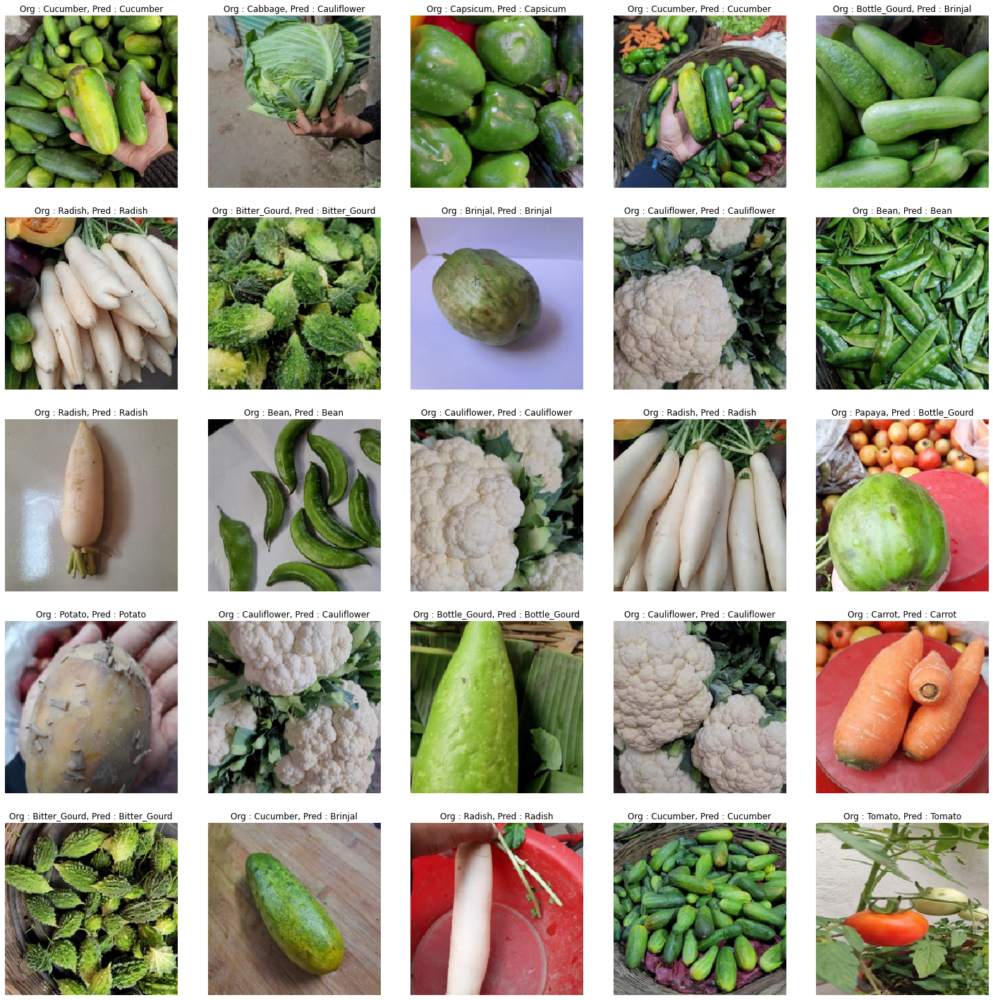

In [ ]:
show_images(model=model, data=test_data)